# Разведочный анализ данных. Исследование и визуализация данных.

## 1) Текстовое описание набора данных

Набор данных по исследованию качества воздуха - https://archive.ics.uci.edu/dataset/360/air+quality

Набор содержит почасовые данные, полученные от комбинированного газоанализатора, установленного в итальянском городе вблизи автомобильной магистрали. Данные записывались с Марта 2004 по февраль 2005 (один год).  

Датасет состоит из 2-х файлов одинаковых данных в формате .csv и .xlsx 

Каждый файл содержит следующие колонки:
- Date	дата в формате ДЕНЬ-МЕСЯЦ-ГОД Набор данных содержит данные с интервалом измерения в один час.
- Time	время в формате ЧАСЫ:МИНУТЫ:СЕКУНДЫ.
- CO(GT)	концентрация СО mg/m^3
- PT08.S1(CO)	концентрация СО mg/m^3 усредненная за час 
- NMHC(GT)	максимальная концентрация паров гидрокарбонатов усредненная за час  microg/m^3 
- C6H6(GT)	максимальная концентрация паров бензина усредненная за час  microg/m^3
- PT08.S2(NMHC)	концентрация паров гидрокарбонатов усредненная за час  microg/m^3
- NOx(GT)	максимальная концентрация оксидов азота усредненная за час  microg/m^3
- PT08.S3(NOx)	концентрация оксидов азота усредненная за час  microg/m^3
- NO2(GT)	максимальная концентрация двуокиси азота усредненная за час  microg/m^3
- PT08.S4(NO2)	концентрация двуокиси азота усредненная за час  microg/m^3
- PT08.S5(O3)	концентрация озона усредненная за час  microg/m^3
- T	температура в градусах Цельсия
- RH	относительная влажность в %.
- AH	абсолютная влажность в %.


# Импорт библиотек


In [65]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 
sns.set(style="ticks")

# Загрузка данных



In [66]:
# 
data = pd.read_csv('air+quality/1.csv', sep=";")
data = data.drop(columns=['Unnamed: 15', 'Unnamed: 16'])

# 2) Основные характеристики датасета

In [67]:
# Первые 5 строк датасета
data.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18.00.00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,10/03/2004,19.00.00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,10/03/2004,20.00.00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,10/03/2004,21.00.00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,10/03/2004,22.00.00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


In [68]:
# Размер датасета - 9358 строк, 15 колонок
data.shape

(9471, 15)

In [69]:
total_count = data.shape[0]
print('Всего строк: {}'.format(total_count))

Всего строк: 9471


In [70]:
# Список колонок
data.columns

Index(['Date', 'Time', 'CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)',
       'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)',
       'PT08.S5(O3)', 'T', 'RH', 'AH'],
      dtype='object')

In [71]:
# Список колонок с типами данных
data.dtypes

Date              object
Time              object
CO(GT)           float64
PT08.S1(CO)      float64
NMHC(GT)         float64
C6H6(GT)         float64
PT08.S2(NMHC)    float64
NOx(GT)          float64
PT08.S3(NOx)     float64
NO2(GT)          float64
PT08.S4(NO2)     float64
PT08.S5(O3)      float64
T                float64
RH               float64
AH               float64
dtype: object

In [72]:
# Проверим наличие пустых значений
# Цикл по колонкам датасета
for col in data.columns:
    # Количество пустых значений - все значения заполнены
    temp_null_count = data[data[col]==-200].shape[0]
    print('{} - {}'.format(col, temp_null_count))

Date - 0
Time - 0
CO(GT) - 1683
PT08.S1(CO) - 366
NMHC(GT) - 8443
C6H6(GT) - 366
PT08.S2(NMHC) - 366
NOx(GT) - 1639
PT08.S3(NOx) - 366
NO2(GT) - 1642
PT08.S4(NO2) - 366
PT08.S5(O3) - 366
T - 366
RH - 366
AH - 366


In [73]:
# Основные статистические характеристки набора данных
data.describe()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
count,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000
mean,-34.207524,1048.990061,-159.090093,1.865683,894.595276,168.616971,794.990168,58.148873,1391.479641,975.072032,9.778305,39.485380,-6.837604
std,77.657170,329.832710,139.789093,41.380206,342.333252,257.433866,321.993552,126.940455,467.210125,456.938184,43.203623,51.216145,38.976670
min,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000
25%,0.600000,921.000000,-200.000000,4.000000,711.000000,50.000000,637.000000,53.000000,1185.000000,700.000000,10.900000,34.100000,0.692300
50%,1.500000,1053.000000,-200.000000,7.900000,895.000000,141.000000,794.000000,96.000000,1446.000000,942.000000,17.200000,48.600000,0.976800
75%,2.600000,1221.000000,-200.000000,13.600000,1105.000000,284.000000,960.000000,133.000000,1662.000000,1255.000000,24.100000,61.900000,1.296200
max,11.900000,2040.000000,1189.000000,63.700000,2214.000000,1479.000000,2683.000000,340.000000,2775.000000,2523.000000,44.600000,88.700000,2.231000


# 3) Визуальное исследование датасета

### [Диаграмма рассеяния](https://en.wikipedia.org/wiki/Scatter_plot)


<Axes: xlabel='T', ylabel='RH'>

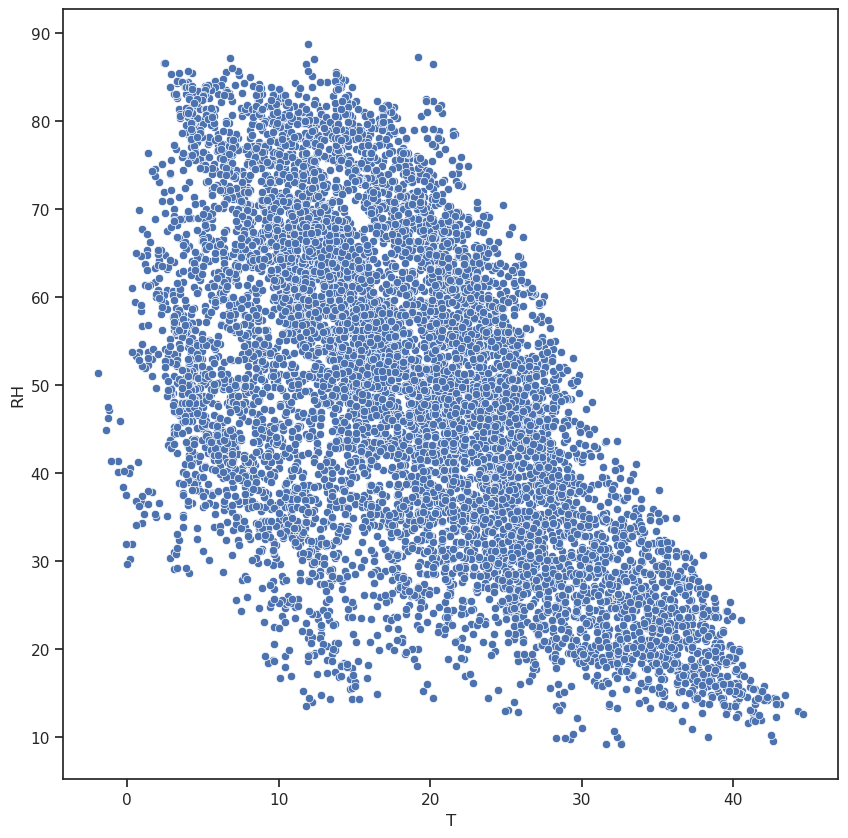

In [74]:
# Exclude rows with wrong data
data_filtered = data.where((data['T']>=-10) & (data['RH']>=-10)) 

fig, ax = plt.subplots(figsize=(10,10)) 

sns.scatterplot(ax=ax, x='T', y='RH', data=data_filtered)

<Axes: xlabel='T', ylabel='AH'>

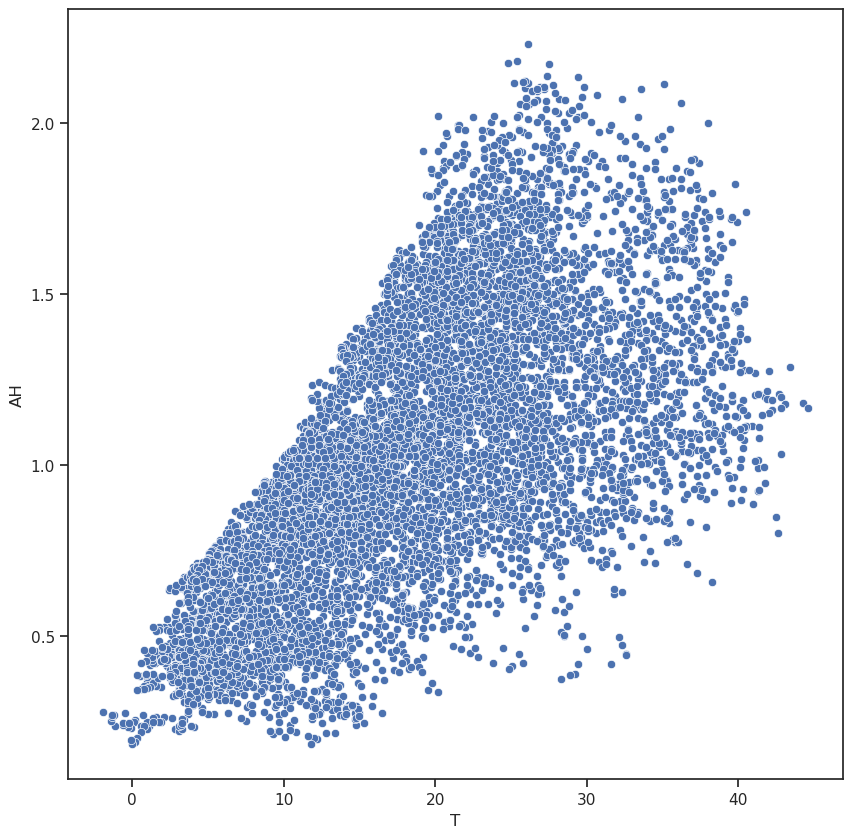

In [75]:
# Exclude rows with wrong data
data_filtered = data.where((data['T']>=-10) & (data['AH']>=-10)) 

fig, ax = plt.subplots(figsize=(10,10)) 

sns.scatterplot(ax=ax, x='T', y='AH', data=data_filtered)

<Axes: xlabel='RH', ylabel='AH'>

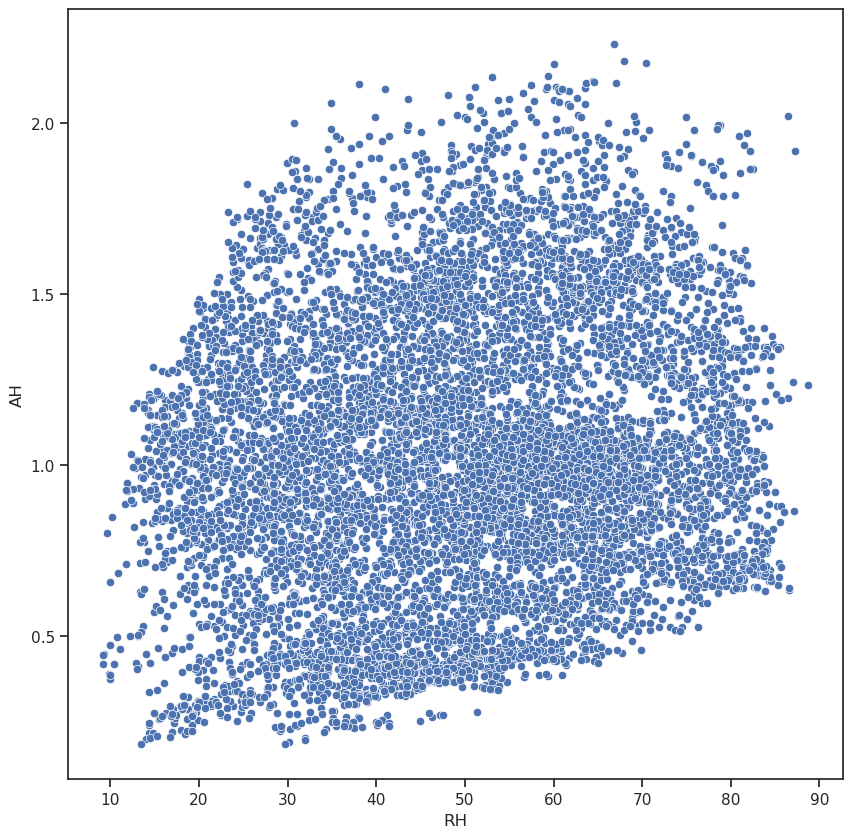

In [76]:
# Exclude rows with wrong data
data_filtered = data.where((data['RH']>=-10) & (data['AH']>=-10)) 

fig, ax = plt.subplots(figsize=(10,10)) 

sns.scatterplot(ax=ax, x='RH', y='AH', data=data_filtered)

## [Гистограмма](https://en.wikipedia.org/wiki/Histogram) 


<Axes: xlabel='RH', ylabel='Count'>

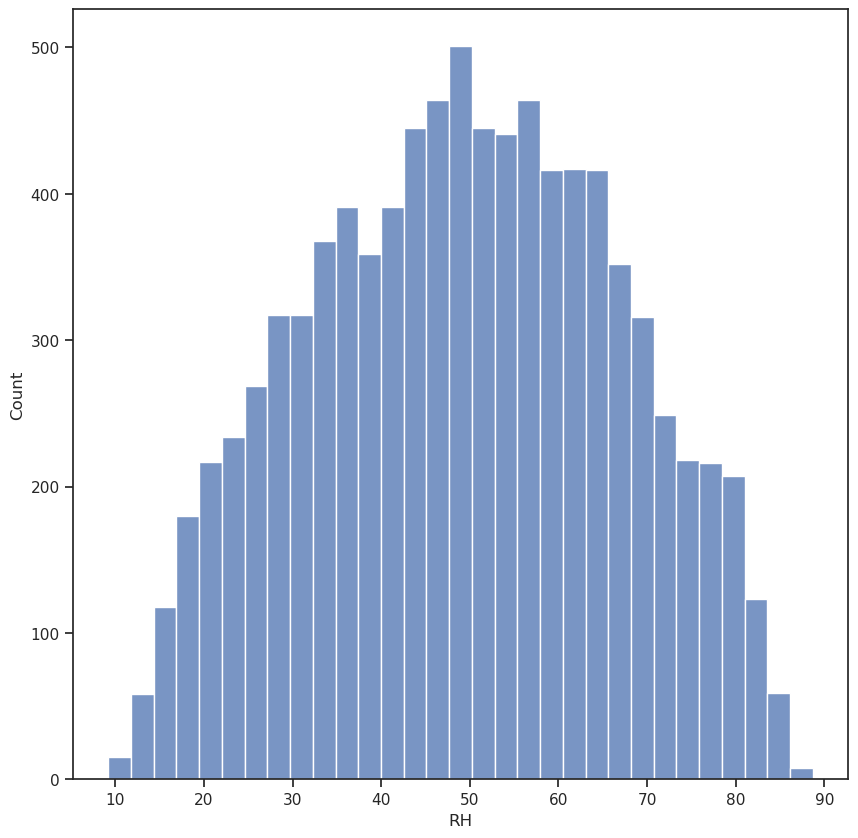

In [77]:
# Exclude rows with wrong data
data_filtered = data.where((data['RH']>=-10) & (data['AH']>=-10)) 

fig, ax = plt.subplots(figsize=(10,10)) 
sns.histplot(data_filtered['RH'])

### Jointplot
Комбинация гистограмм и диаграмм рассеивания.

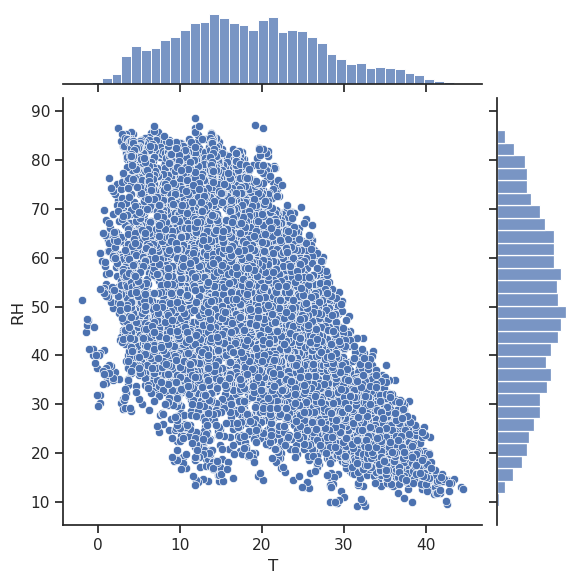

In [78]:
# Exclude rows with wrong data
data_filtered = data.where((data['T']>=-10) & (data['RH']>=-10)) 

sns.jointplot(x='T', y='RH', data=data_filtered)

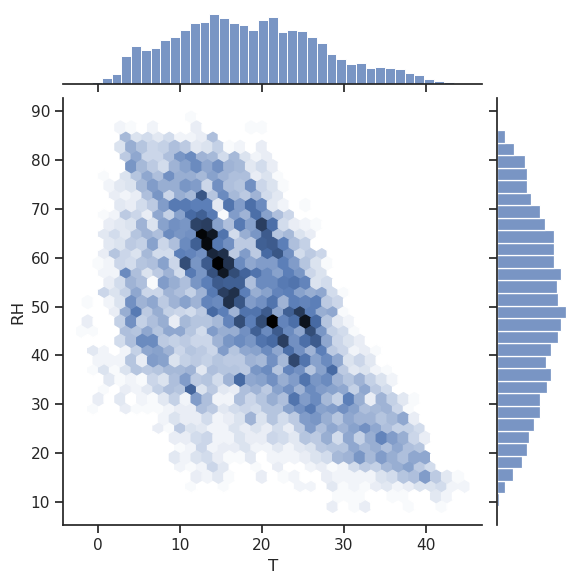

In [79]:
# Exclude rows with wrong data
data_filtered = data.where((data['T']>=-10) & (data['RH']>=-10)) 

sns.jointplot(x='T', y='RH', data=data_filtered, kind="hex")


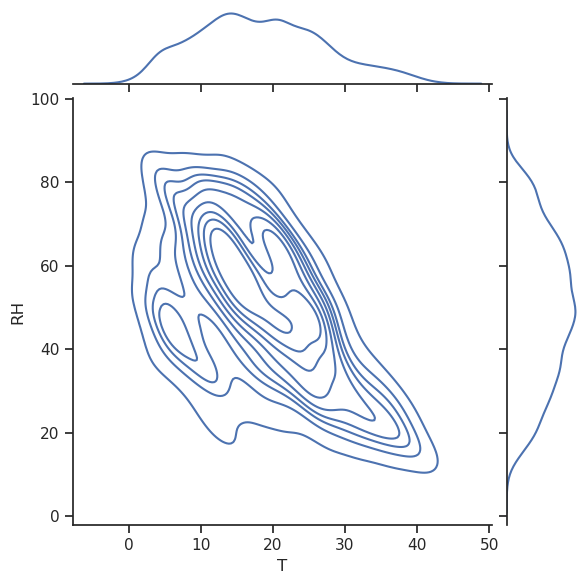

In [80]:
# Exclude rows with wrong data
data_filtered = data.where((data['T']>=-10) & (data['RH']>=-10)) 

sns.jointplot(x='T', y='RH', data=data_filtered, kind="kde")


### "Парные диаграммы"
Комбинация гистограмм и диаграмм рассеивания для всего набора данных.

Выводится матрица графиков. На пересечении строки и столбца, которые соответстуют двум показателям, строится диаграмма рассеивания. В главной диагонали матрицы строятся гистограммы распределения соответствующих показателей.

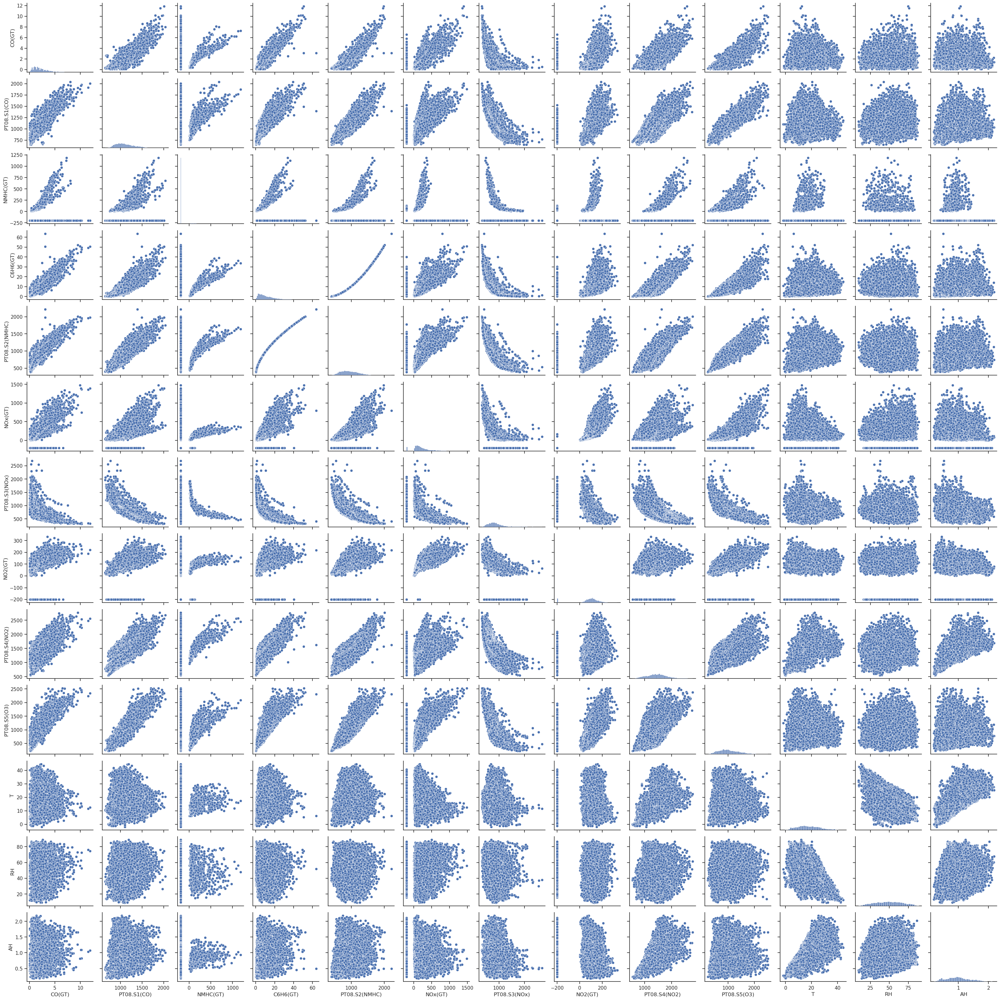

In [81]:
# Exclude rows with wrong data
data_filtered = data.where((data['T']>=-10) & (data['RH']>=-10)& (data['AH']>=-10)& (data['CO(GT)']>=-10)) 
sns.pairplot(data_filtered)

С помощью параметра "hue" возможна группировка по значениям какого-либо признака.

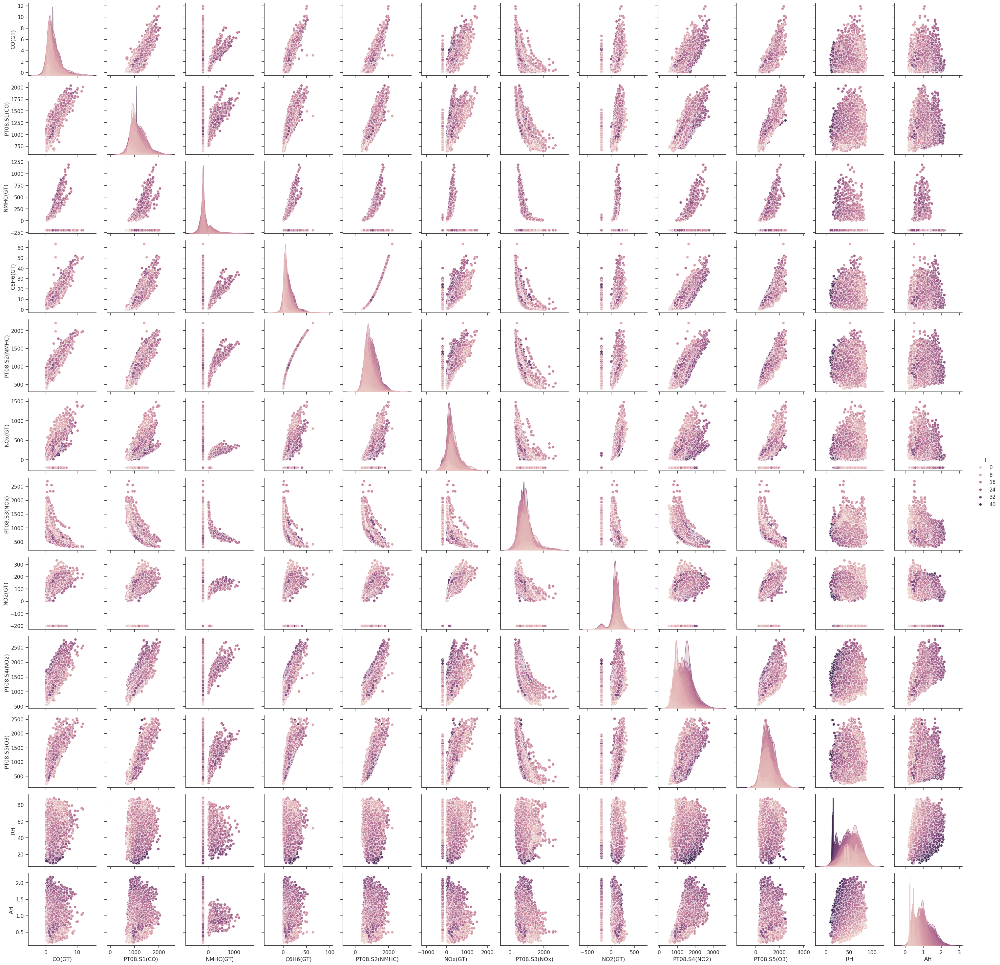

In [82]:
# Exclude rows with wrong data
data_filtered = data.where((data['T']>=-10) & (data['RH']>=-10)& (data['AH']>=-10)& (data['CO(GT)']>=-10))

sns.pairplot(data_filtered, hue="T")

### [Ящик с усами](https://en.wikipedia.org/wiki/Box_plot)
Отображает одномерное распределение вероятности.

<Axes: xlabel='RH'>

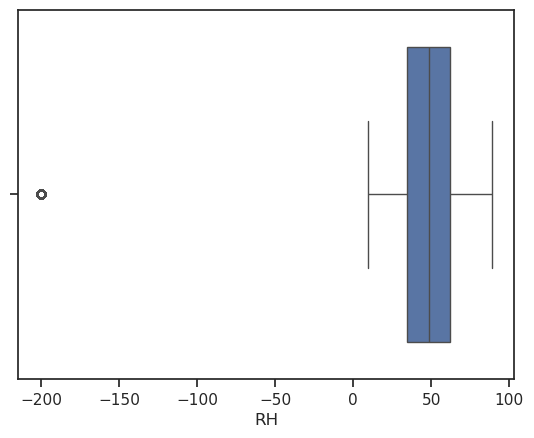

In [83]:
# Exclude rows with wrong data
data_filtered = data.where((data['T']>=-10) & (data['RH']>=-10)& (data['AH']>=-10)& (data['CO(GT)']>=-10))
sns.boxplot(x=data['RH'])

<Axes: ylabel='RH'>

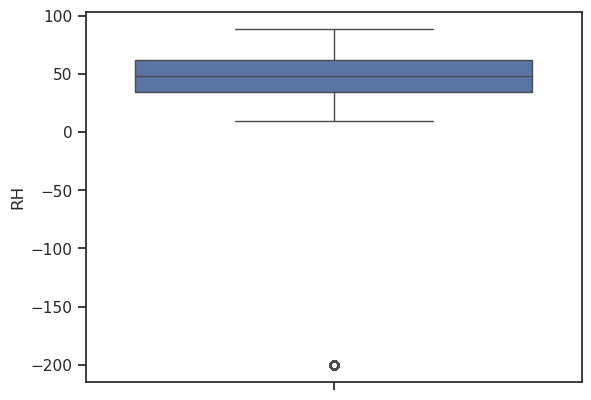

In [84]:
# Exclude rows with wrong data
data_filtered = data.where((data['T']>=-10) & (data['RH']>=-10)& (data['AH']>=-10)& (data['CO(GT)']>=-10))

# По вертикали
sns.boxplot(y=data['RH'])

<Axes: xlabel='T', ylabel='CO(GT)'>

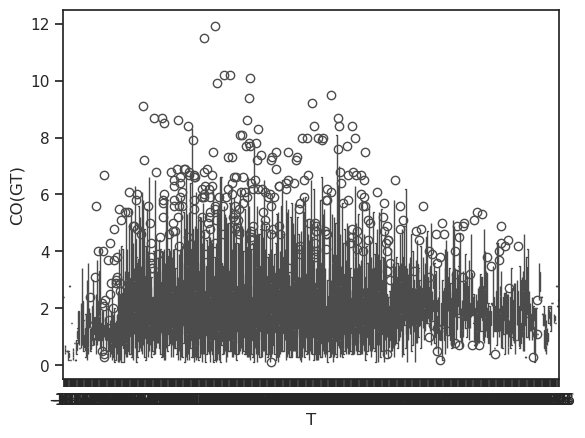

In [85]:
# Exclude rows with wrong data
data_filtered = data.where((data['T']>=-10) & (data['RH']>=-10)& (data['AH']>=-10)& (data['CO(GT)']>=-10))

# Распределение параметра Humidity сгруппированные по Occupancy.
sns.boxplot(x='T', y='CO(GT)', data=data_filtered)

### [Violin plot](https://en.wikipedia.org/wiki/Violin_plot)
Похоже на предыдущую диаграмму, но по краям отображаются распределения плотности - https://en.wikipedia.org/wiki/Kernel_density_estimation

<Axes: xlabel='CO(GT)'>

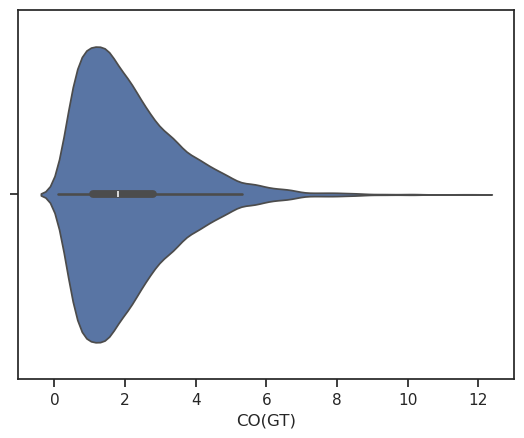

In [86]:
# Exclude rows with wrong data
data_filtered = data.where((data['T']>=-10) & (data['RH']>=-10)& (data['AH']>=-10)& (data['CO(GT)']>=-10))

sns.violinplot(x=data_filtered['CO(GT)'])

<Axes: xlabel='CO(GT)', ylabel='Count'>

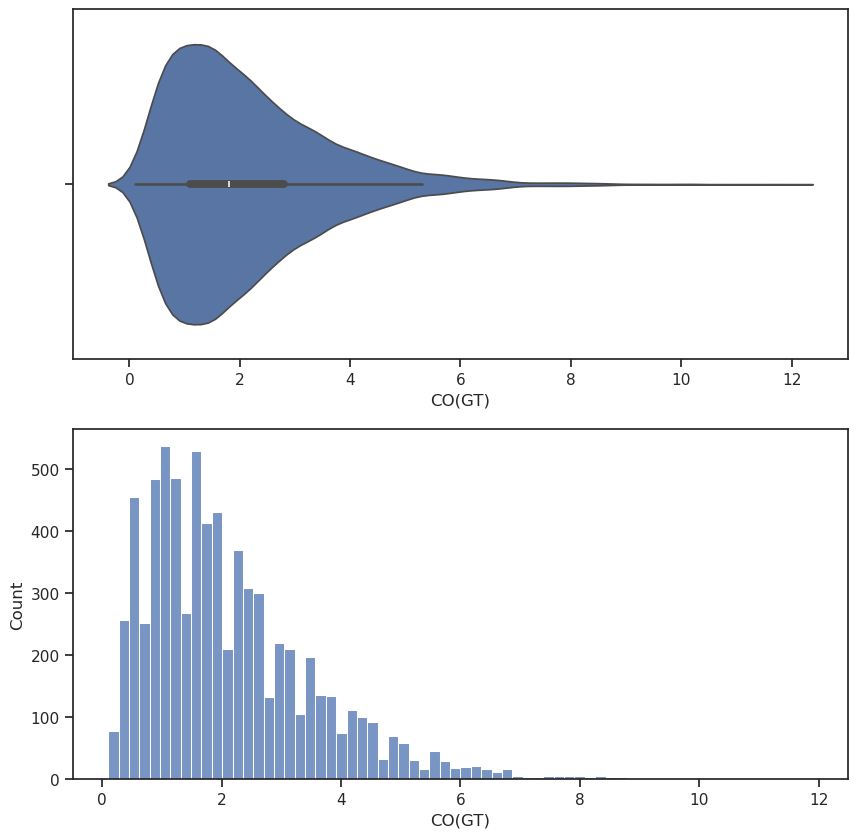

In [87]:
# Exclude rows with wrong data
data_filtered = data.where((data['T']>=-10) & (data['RH']>=-10)& (data['AH']>=-10)& (data['CO(GT)']>=-10))

fig, ax = plt.subplots(2, 1, figsize=(10,10))
sns.violinplot(ax=ax[0], x=data_filtered['CO(GT)'])
sns.histplot(data_filtered['CO(GT)'], ax=ax[1])

Из приведенных графиков видно, что violinplot действительно показывает распределение плотности.

<Axes: xlabel='T', ylabel='CO(GT)'>

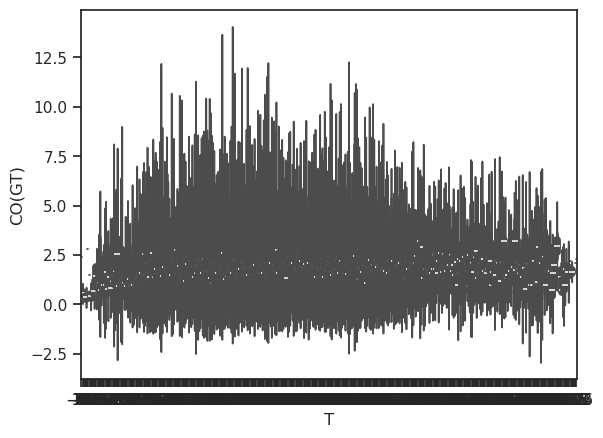

In [88]:
# Exclude rows with wrong data
data_filtered = data.where((data['T']>=-10) & (data['RH']>=-10)& (data['AH']>=-10)& (data['CO(GT)']>=-10))
sns.violinplot(x='T', y='CO(GT)', data=data_filtered)

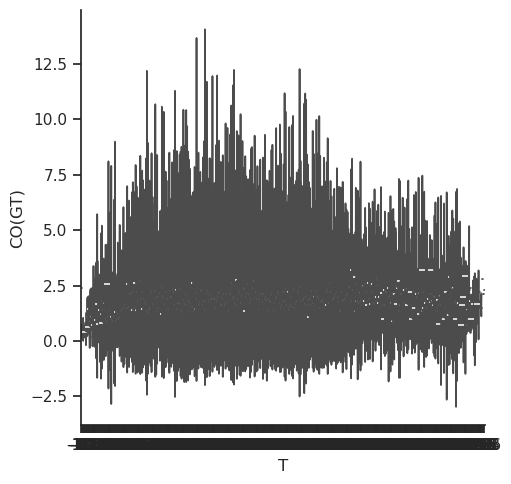

In [89]:
# Exclude rows with wrong data
data_filtered = data.where((data['T']>=-10) & (data['RH']>=-10)& (data['AH']>=-10)& (data['CO(GT)']>=-10))

sns.catplot(y='CO(GT)', x='T', data=data_filtered, kind="violin", split=True)

# 4) Информация о корреляции признаков

In [90]:

data.corr(numeric_only=True)

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
CO(GT),1.000000,0.041411,0.128351,-0.031378,0.029926,0.526451,-0.089981,0.671127,-0.073724,0.080310,-0.068939,-0.048227,-0.045892
PT08.S1(CO),0.041411,1.000000,0.170007,0.852687,0.933102,0.277993,0.087019,0.154030,0.845149,0.892434,0.754844,0.745375,0.764903
NMHC(GT),0.128351,0.170007,1.000000,0.037323,0.110104,-0.004427,0.048821,0.103307,0.162680,0.101185,-0.000009,0.008284,0.012500
C6H6(GT),-0.031378,0.852687,0.037323,1.000000,0.767433,-0.001174,0.512193,-0.010992,0.774673,0.641334,0.971375,0.925062,0.984555
PT08.S2(NMHC),0.029926,0.933102,0.110104,0.767433,1.000000,0.331272,-0.073667,0.176488,0.874782,0.909905,0.669025,0.585803,0.646572
NOx(GT),0.526451,0.277993,-0.004427,-0.001174,0.331272,1.000000,-0.436084,0.817139,0.035546,0.461889,-0.138452,-0.053009,-0.095847
PT08.S3(NOx),-0.089981,0.087019,0.048821,0.512193,-0.073667,-0.436084,1.000000,-0.256232,0.122734,-0.208865,0.588111,0.573549,0.621618
NO2(GT),0.671127,0.154030,0.103307,-0.010992,0.176488,0.817139,-0.256232,1.000000,-0.022174,0.253439,-0.084104,-0.081305,-0.060440
PT08.S4(NO2),-0.073724,0.845149,0.162680,0.774673,0.874782,0.035546,0.122734,-0.022174,1.000000,0.723690,0.755060,0.640707,0.691913
PT08.S5(O3),0.080310,0.892434,0.101185,0.641334,0.909905,0.461889,-0.208865,0.253439,0.723690,1.000000,0.503700,0.524955,0.519467


In [91]:
data.corr(method='pearson', numeric_only=True)

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
CO(GT),1.000000,0.041411,0.128351,-0.031378,0.029926,0.526451,-0.089981,0.671127,-0.073724,0.080310,-0.068939,-0.048227,-0.045892
PT08.S1(CO),0.041411,1.000000,0.170007,0.852687,0.933102,0.277993,0.087019,0.154030,0.845149,0.892434,0.754844,0.745375,0.764903
NMHC(GT),0.128351,0.170007,1.000000,0.037323,0.110104,-0.004427,0.048821,0.103307,0.162680,0.101185,-0.000009,0.008284,0.012500
C6H6(GT),-0.031378,0.852687,0.037323,1.000000,0.767433,-0.001174,0.512193,-0.010992,0.774673,0.641334,0.971375,0.925062,0.984555
PT08.S2(NMHC),0.029926,0.933102,0.110104,0.767433,1.000000,0.331272,-0.073667,0.176488,0.874782,0.909905,0.669025,0.585803,0.646572
NOx(GT),0.526451,0.277993,-0.004427,-0.001174,0.331272,1.000000,-0.436084,0.817139,0.035546,0.461889,-0.138452,-0.053009,-0.095847
PT08.S3(NOx),-0.089981,0.087019,0.048821,0.512193,-0.073667,-0.436084,1.000000,-0.256232,0.122734,-0.208865,0.588111,0.573549,0.621618
NO2(GT),0.671127,0.154030,0.103307,-0.010992,0.176488,0.817139,-0.256232,1.000000,-0.022174,0.253439,-0.084104,-0.081305,-0.060440
PT08.S4(NO2),-0.073724,0.845149,0.162680,0.774673,0.874782,0.035546,0.122734,-0.022174,1.000000,0.723690,0.755060,0.640707,0.691913
PT08.S5(O3),0.080310,0.892434,0.101185,0.641334,0.909905,0.461889,-0.208865,0.253439,0.723690,1.000000,0.503700,0.524955,0.519467


In [92]:
data.corr(method='kendall', numeric_only=True)

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
CO(GT),1.000000,0.472891,0.116956,0.498867,0.497997,0.653417,-0.444744,0.612872,0.217386,0.451896,-0.048652,-0.029824,-0.076418
PT08.S1(CO),0.472891,1.000000,0.107550,0.730702,0.729441,0.378117,-0.559376,0.347637,0.503611,0.736185,0.123904,0.131613,0.160451
NMHC(GT),0.116956,0.107550,1.000000,0.025173,0.025170,-0.023014,0.123550,0.023554,0.099407,0.020965,-0.073650,0.008651,-0.123358
C6H6(GT),0.498867,0.730702,0.025173,1.000000,0.998164,0.356647,-0.540214,0.335968,0.593188,0.714456,0.245567,0.000759,0.193875
PT08.S2(NMHC),0.497997,0.729441,0.025170,0.998164,1.000000,0.356012,-0.539224,0.335345,0.592145,0.713237,0.245109,0.000756,0.193505
NOx(GT),0.653417,0.378117,-0.023014,0.356647,0.356012,1.000000,-0.441555,0.758875,0.053795,0.416081,-0.174813,0.037172,-0.165641
PT08.S3(NOx),-0.444744,-0.559376,0.123550,-0.540214,-0.539224,-0.441555,1.000000,-0.379034,-0.278358,-0.553965,0.003563,0.024278,-0.059580
NO2(GT),0.612872,0.347637,0.023554,0.335968,0.335345,0.758875,-0.379034,1.000000,0.047379,0.364768,-0.137823,-0.090275,-0.225921
PT08.S4(NO2),0.217386,0.503611,0.099407,0.593188,0.592145,0.053795,-0.278358,0.047379,1.000000,0.446498,0.476026,0.035310,0.505119
PT08.S5(O3),0.451896,0.736185,0.020965,0.714456,0.713237,0.416081,-0.553965,0.364768,0.446498,1.000000,0.073054,0.152950,0.126318


In [93]:
data.corr(method='spearman', numeric_only=True)

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
CO(GT),1.000000,0.584303,0.136404,0.589675,0.589660,0.813398,-0.580009,0.770475,0.304593,0.575858,-0.070522,-0.043470,-0.113679
PT08.S1(CO),0.584303,1.000000,0.132093,0.901943,0.901952,0.507425,-0.645027,0.475732,0.685713,0.906212,0.184913,0.194736,0.235418
NMHC(GT),0.136404,0.132093,1.000000,0.027654,0.027701,-0.037532,0.161023,0.021889,0.119579,0.024717,-0.095652,0.011119,-0.157001
C6H6(GT),0.589675,0.901943,0.027654,1.000000,0.999986,0.479695,-0.641706,0.456964,0.776905,0.888051,0.357331,0.004280,0.282890
PT08.S2(NMHC),0.589660,0.901952,0.027701,0.999986,1.000000,0.479659,-0.641697,0.456908,0.776904,0.888063,0.357277,0.004289,0.282844
NOx(GT),0.813398,0.507425,-0.037532,0.479695,0.479659,1.000000,-0.580659,0.906417,0.066173,0.551341,-0.262647,0.058493,-0.243340
PT08.S3(NOx),-0.580009,-0.645027,0.161023,-0.641706,-0.641697,-0.580659,1.000000,-0.521751,-0.362894,-0.652411,0.007710,0.038280,-0.080139
NO2(GT),0.770475,0.475732,0.021889,0.456964,0.456908,0.906417,-0.521751,1.000000,0.060535,0.497793,-0.203430,-0.133815,-0.329867
PT08.S4(NO2),0.304593,0.685713,0.119579,0.776905,0.776904,0.066173,-0.362894,0.060535,1.000000,0.610442,0.657941,0.053909,0.685177
PT08.S5(O3),0.575858,0.906212,0.024717,0.888051,0.888063,0.551341,-0.652411,0.497793,0.610442,1.000000,0.110878,0.226369,0.186709


В случае большого количества признаков анализ числовой корреляционной матрицы становится неудобен. 

Для визуализации корреляционной матрицы будем использовать "тепловую карту" heatmap которая показывает степень корреляции различными цветами.

Используем метод heatmap библиотеки seaborn - https://seaborn.pydata.org/generated/seaborn.heatmap.html

<Axes: >

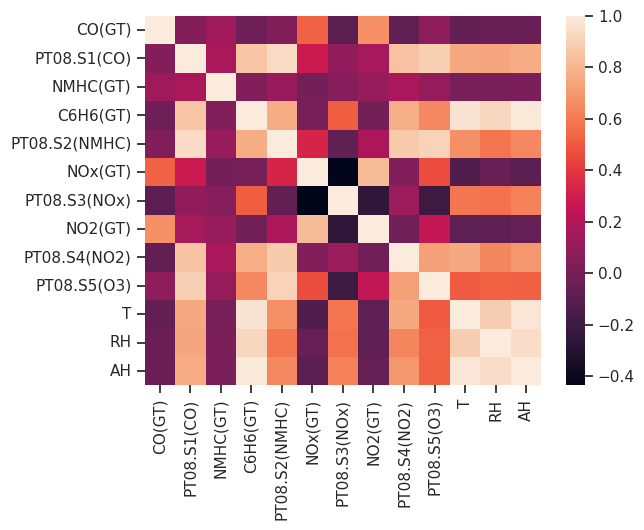

In [94]:
sns.heatmap(data.corr(numeric_only=True))

<Axes: >

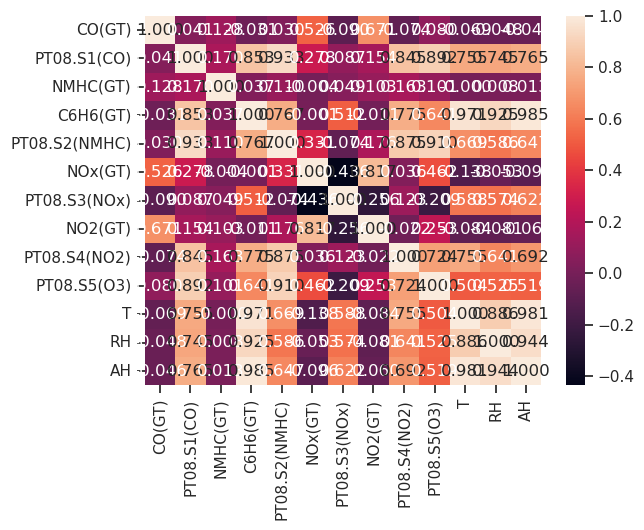

In [95]:
# Вывод значений в ячейках
sns.heatmap(data.corr(numeric_only=True), annot=True, fmt='.3f')

<Axes: >

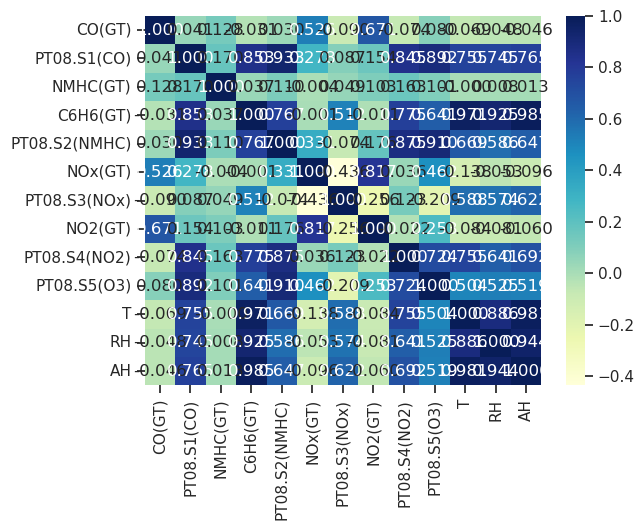

In [96]:
# Изменение цветовой гаммы
sns.heatmap(data.corr(numeric_only=True), cmap='YlGnBu', annot=True, fmt='.3f')

<Axes: >

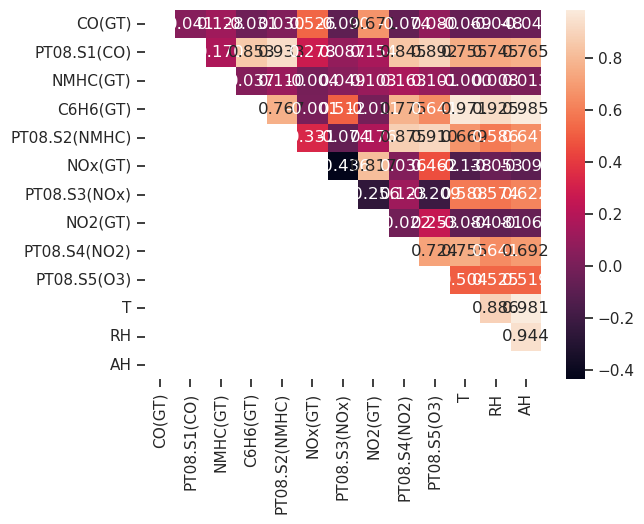

In [97]:
# Треугольный вариант матрицы
mask = np.zeros_like(data.corr(numeric_only=True), dtype=np.bool)
# чтобы оставить нижнюю часть матрицы
# mask[np.triu_indices_from(mask)] = True
# чтобы оставить верхнюю часть матрицы
mask[np.tril_indices_from(mask)] = True
sns.heatmap(data.corr(numeric_only=True), mask=mask, annot=True, fmt='.3f')

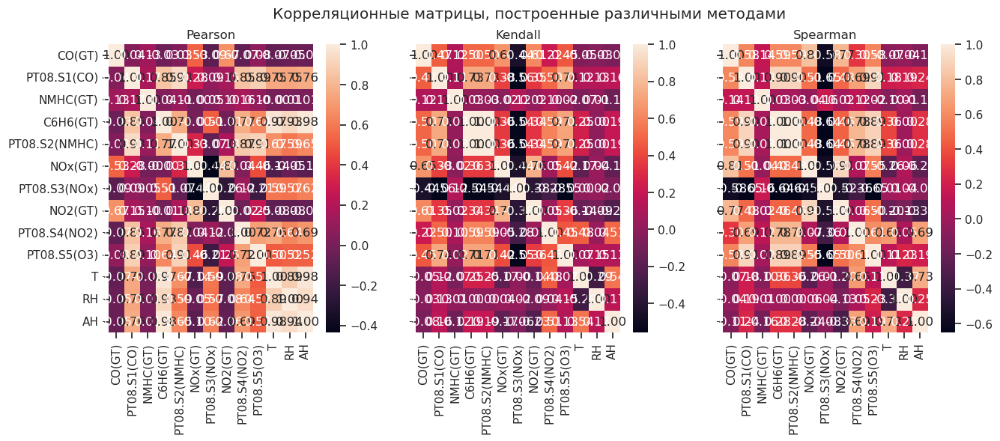

In [98]:
fig, ax = plt.subplots(1, 3, sharex='col', sharey='row', figsize=(15,5))
sns.heatmap(data.corr(method='pearson', numeric_only=True), ax=ax[0], annot=True, fmt='.2f')
sns.heatmap(data.corr(method='kendall', numeric_only=True), ax=ax[1], annot=True, fmt='.2f')
sns.heatmap(data.corr(method='spearman', numeric_only=True), ax=ax[2], annot=True, fmt='.2f')
fig.suptitle('Корреляционные матрицы, построенные различными методами')
ax[0].title.set_text('Pearson')
ax[1].title.set_text('Kendall')
ax[2].title.set_text('Spearman')

### Тепловая карта с указание размера


<Axes: >

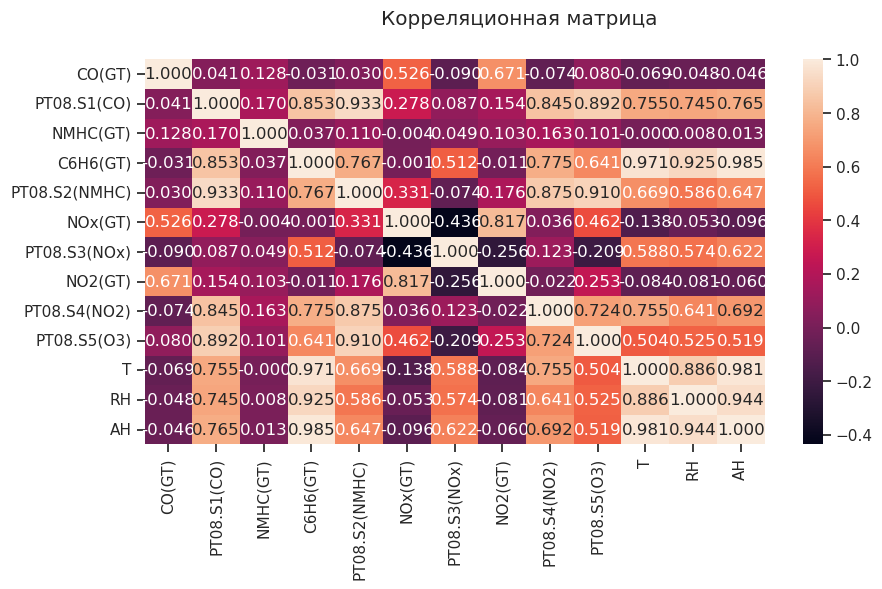

In [99]:
fig, ax = plt.subplots(1, 1, sharex='col', sharey='row', figsize=(10,5))
fig.suptitle('Корреляционная матрица')
sns.heatmap(data.corr(numeric_only=True), ax=ax, annot=True, fmt='.3f')